# Time Series Weather Data Analysis

A small project analysing time series weather data.
Data Source- https://archive.ics.uci.edu/ml/machine-learning-databases/00501/PRSA2017_Data_20130301-20170228.zip

## 1. Import Necessary Modules

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as dates
import seaborn as sns
import plotly.express as px
import os
import warnings
from datetime import datetime
from download import download

%matplotlib inline

## 2. Download Dataset

In [2]:
import wget
url='https://archive.ics.uci.edu/ml/machine-learning-databases/00501/PRSA2017_Data_20130301-20170228.zip'
wget.download(url)

'PRSA2017_Data_20130301-20170228 (4).zip'

## Dataset Information

* **PM2.5:** Particulate matter (PM) is a mixture of solid particles and liquid droplets found in the air. PM2.5 is a type of particulate matter that is smaller than 2.5 micrometers in diameter. This means that it is small enough to be inhaled deep into the lungs. PM2.5 can be made up of a variety of materials, including dust, dirt, smoke, and soot. It can come from a variety of sources, including cars, trucks, power plants, and construction sites.

* **PM10:** PM10 is a type of particulate matter that is smaller than 10 micrometers in diameter. It is larger than PM2.5, but it can still be harmful to human health. PM10 can come from the same sources as PM2.5, but it can also come from windblown dust and wildfires.

* **SO2:** Sulfur dioxide (SO2) is a gas that is released into the air when fossil fuels are burned. SO2 can react with water in the air to form sulfuric acid, which can cause acid rain. SO2 can also irritate the lungs and worsen asthma symptoms.

* **NO2:** Nitrogen dioxide (NO2) is a gas that is released into the air when fossil fuels are burned. NO2 can react with other pollutants in the air to form ground level ozone, which is a harmful air pollutant. NO2 can also irritate the lungs and worsen asthma symptoms.

* **CO:** Carbon monoxide (CO) is a gas that is released into the air when fossil fuels are burned. CO can bind to hemoglobin in the blood, preventing it from carrying oxygen. This can lead to headaches, dizziness, and nausea. In high concentrations, CO can be fatal.

* **O3:** Ozone (O3) is a gas that is found in the Earth’s atmosphere. Ozone is created when ultraviolet radiation from the sun reacts with oxygen molecules in the air. Ozone can be harmful to human health, especially at ground level. Ground-level ozone can irritate the lungs and worsen asthma symptoms. It can also damage plants and crops.

* **Temp:** Temperature is a measure of the average kinetic energy of the particles in a substance. In meteorology, temperature is typically measured in degrees Celsius (°C) or degrees Fahrenheit (°F).

* **PRES:** Pressure is a measure of the force exerted by a substance on its surroundings. In meteorology, pressure is typically measured in millibars (mb) or inches of mercury (Hg).

* **DEWP:** Dew point is the temperature at which the air becomes saturated with water vapor and dew begins to form.

* **RAIN:** Rain is a form of precipitation that occurs when water vapor in the atmosphere condenses and falls to the ground.

* **WD:** Wind direction is the direction from which the wind is blowing. Wind direction is typically measured in degrees from north.

* **WSPM:** Wind speed is the speed of the wind. Wind speed is typically measured in meters per second (m/s) or miles per hour (mph).

* **Station:** A weather station is a location where weather observations are made. Weather stations typically measure temperature, pressure, humidity, wind speed and direction, precipitation, and cloud cover.

## 3. Exploring Dataset

In [3]:
df = pd.read_csv("PRSA_Data_Dingling_20130301-20170228.csv")

In [4]:
df.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [5]:
df.tail()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
35059,35060,2017,2,28,19,11.0,11.0,2.0,2.0,200.0,99.0,11.7,1008.9,-13.3,0.0,NNE,1.3,Dingling
35060,35061,2017,2,28,20,13.0,13.0,2.0,2.0,200.0,101.0,10.9,1009.0,-14.0,0.0,N,2.1,Dingling
35061,35062,2017,2,28,21,9.0,14.0,2.0,2.0,200.0,102.0,9.5,1009.4,-13.0,0.0,N,1.5,Dingling
35062,35063,2017,2,28,22,10.0,12.0,2.0,2.0,200.0,97.0,7.8,1009.6,-12.6,0.0,NW,1.4,Dingling
35063,35064,2017,2,28,23,13.0,16.0,4.0,9.0,500.0,74.0,7.0,1009.4,-12.2,0.0,N,1.9,Dingling


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34285 non-null  float64
 6   PM10     34408 non-null  float64
 7   SO2      34334 non-null  float64
 8   NO2      33830 non-null  float64
 9   CO       33052 non-null  float64
 10  O3       33850 non-null  float64
 11  TEMP     35011 non-null  float64
 12  PRES     35014 non-null  float64
 13  DEWP     35011 non-null  float64
 14  RAIN     35013 non-null  float64
 15  wd       34924 non-null  object 
 16  WSPM     35021 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


### Convert to datetime

In [7]:
def convert_to_date(x):
    return datetime.strptime(x,'%Y %m %d %H')

In [8]:
df_new = pd.read_csv("PRSA_Data_Dingling_20130301-20170228.csv", 
                     parse_dates=[['year','month','day','hour']],
                     date_parser=convert_to_date, keep_date_col= True)

In [9]:
df_new.head()

,year_month_day_hour,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [10]:
df_new['month'] = pd.to_numeric(df_new['month'])

In [11]:
df_new.shape

(35064, 19)

### Handling Missing Values

In [12]:
df_new.columns.unique()

Index(['year_month_day_hour', 'No', 'year', 'month', 'day', 'hour', 'PM2.5',
       'PM10', 'SO2', 'NO2', 'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd',
       'WSPM', 'station'],
      dtype='object')

In [13]:
df_new.isnull()

,year_month_day_hour,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
35060,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
35061,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
35062,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [14]:
df_new.isnull().sum()

year_month_day_hour       0
No                        0
year                      0
month                     0
day                       0
hour                      0
PM2.5                   779
PM10                    656
SO2                     730
NO2                    1234
CO                     2012
O3                     1214
TEMP                     53
PRES                     50
DEWP                     53
RAIN                     51
wd                      140
WSPM                     43
station                   0
dtype: int64

### See the relationship between numeric features

In [15]:
df_new.describe()

,No,month,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,34285.000000,34408.000000,34334.000000,33830.000000,33052.000000,33850.000000,35011.000000,35014.000000,35011.000000,35013.000000,35021.000000
mean,17532.500000,6.522930,65.989497,83.739723,11.749650,27.585467,904.896073,68.548371,13.686111,1007.760278,1.505495,0.060366,1.853836
std,10122.249256,3.448752,72.267723,79.541685,15.519259,26.383882,903.306220,53.764424,11.365313,10.225664,13.822099,0.752899,1.309808
min,1.000000,1.000000,3.000000,2.000000,0.285600,1.026500,100.000000,0.214200,-16.600000,982.400000,-35.100000,0.000000,0.000000
25%,8766.750000,4.000000,14.000000,26.000000,2.000000,9.000000,300.000000,31.000000,3.400000,999.300000,-10.200000,0.000000,1.000000
50%,17532.500000,7.000000,41.000000,60.000000,5.000000,19.000000,600.000000,61.000000,14.700000,1007.400000,1.800000,0.000000,1.500000
75%,26298.250000,10.000000,93.000000,117.000000,15.000000,38.000000,1200.000000,90.000000,23.300000,1016.000000,14.200000,0.000000,2.300000
max,35064.000000,12.000000,881.000000,905.000000,156.000000,205.000000,10000.000000,500.000000,41.400000,1036.500000,27.200000,52.100000,10.000000


### Setting Index year_month_day_hour

In [16]:
df_new_non_index = df_new.copy()

In [17]:
df_new = df_new.set_index('year_month_day_hour')

In [18]:
df_new.index

DatetimeIndex(['2013-03-01 00:00:00', '2013-03-01 01:00:00',
               '2013-03-01 02:00:00', '2013-03-01 03:00:00',
               '2013-03-01 04:00:00', '2013-03-01 05:00:00',
               '2013-03-01 06:00:00', '2013-03-01 07:00:00',
               '2013-03-01 08:00:00', '2013-03-01 09:00:00',
               ...
               '2017-02-28 14:00:00', '2017-02-28 15:00:00',
               '2017-02-28 16:00:00', '2017-02-28 17:00:00',
               '2017-02-28 18:00:00', '2017-02-28 19:00:00',
               '2017-02-28 20:00:00', '2017-02-28 21:00:00',
               '2017-02-28 22:00:00', '2017-02-28 23:00:00'],
              dtype='datetime64[ns]', name='year_month_day_hour', length=35064, freq=None)

In [19]:
df_new.head()

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


In [20]:
df_new.loc['2013-03-01':'2013-03-05']

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2013-03-05 19:00:00,116,2013,3,5,19,179.0,200.0,50.0,96.0,1600.0,82.0,7.7,1005.4,-7.6,0.0,NNE,0.2,Dingling
2013-03-05 20:00:00,117,2013,3,5,20,172.0,180.0,43.0,94.0,1899.0,82.0,6.3,1005.9,-7.3,0.0,NNE,0.7,Dingling
2013-03-05 21:00:00,118,2013,3,5,21,179.0,191.0,38.0,80.0,1700.0,82.0,5.6,1006.0,-7.3,0.0,NNE,0.2,Dingling


In [21]:
df_new.loc['2013':'2015']

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,,,,,
2013-03-01 00:00:00,1,2013,3,1,0,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
2013-03-01 01:00:00,2,2013,3,1,1,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2013-03-01 02:00:00,3,2013,3,1,2,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
2013-03-01 03:00:00,4,2013,3,1,3,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
2013-03-01 04:00:00,5,2013,3,1,4,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-12-31 19:00:00,24860,2015,12,31,19,85.0,95.0,12.0,73.0,1200.0,2.0,-0.6,1021.0,-9.5,0.0,NE,0.6,Dingling
2015-12-31 20:00:00,24861,2015,12,31,20,NaN,109.0,32.0,79.0,2900.0,2.0,-1.8,1021.2,-9.9,0.0,NW,1.1,Dingling
2015-12-31 21:00:00,24862,2015,12,31,21,80.0,100.0,35.0,81.0,3200.0,2.0,-1.6,1020.8,-9.7,0.0,NE,0.9,Dingling


## 4. Data Visualization

In [22]:
# Find data for PM2.5 (Particulate matter)
pm_data = df_new['PM2.5']
pm_data.head()

year_month_day_hour
2013-03-01 00:00:00    4.0
2013-03-01 01:00:00    7.0
2013-03-01 02:00:00    5.0
2013-03-01 03:00:00    6.0
2013-03-01 04:00:00    5.0
Name: PM2.5, dtype: float64

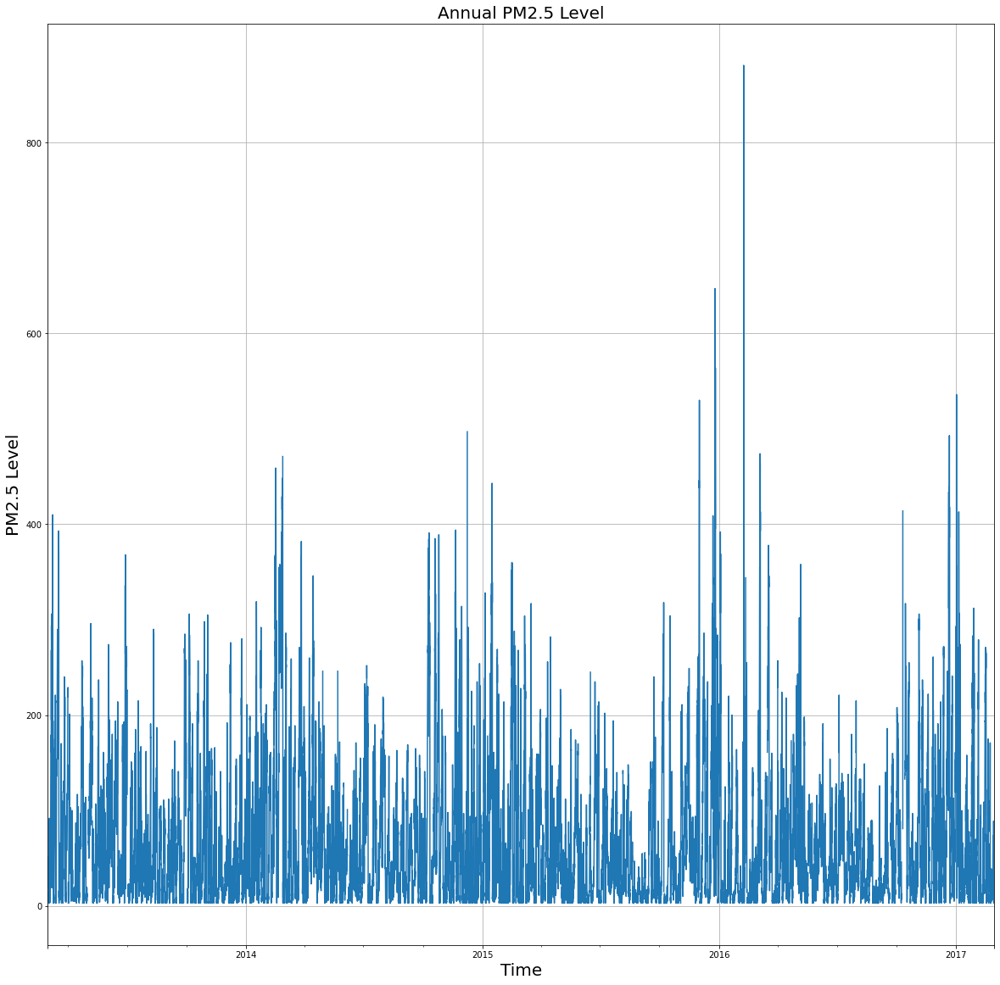

In [59]:
pm_data.plot(grid= True)

plt.xlabel("Time",fontsize=20)
plt.ylabel("PM2.5 Level",fontsize=20)
plt.title("Annual PM2.5 Level",fontsize=20)
plt.rcParams['figure.figsize'] = [20, 20] 
plt.show()


### Perform Analysis per Year

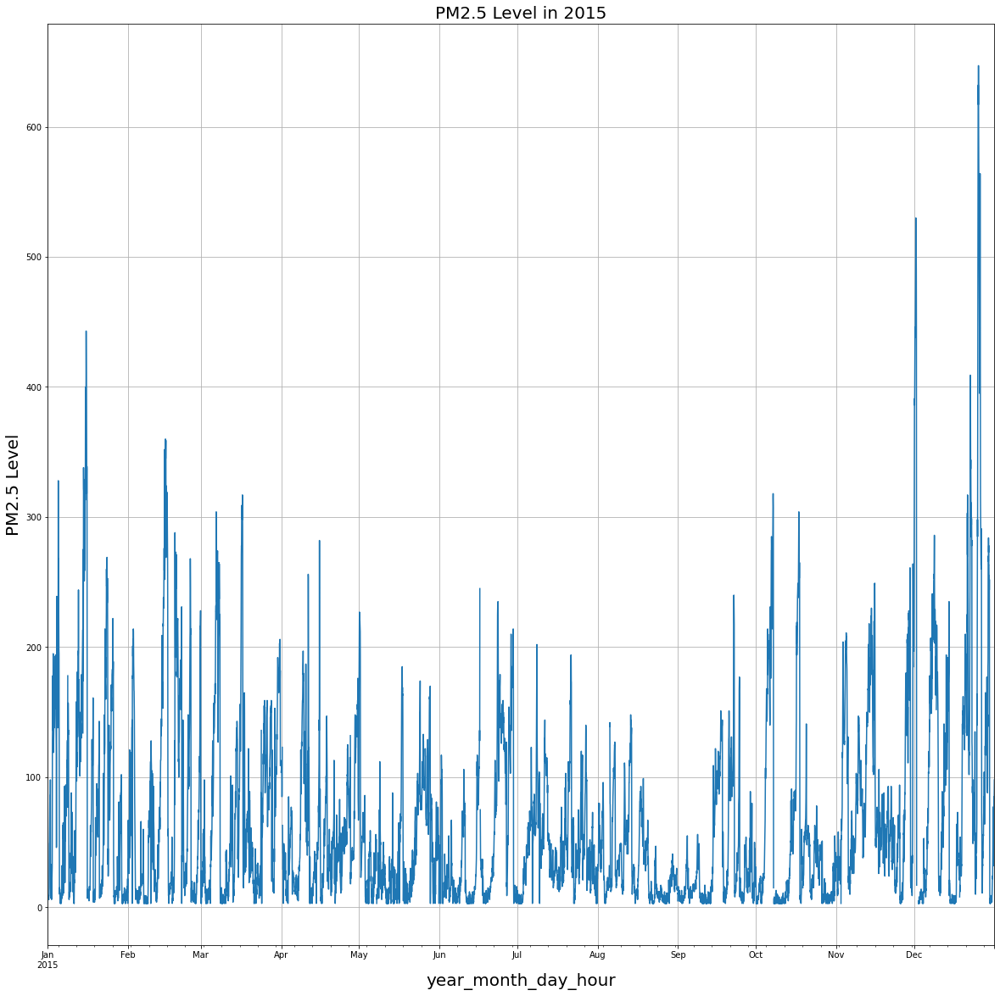

In [60]:
# For year 2015
df_new_2015 = df_new.loc['2015']
pm_data_2015 = df_new_2015['PM2.5']
plt.xlabel("Year : 2015",fontsize=20)
plt.ylabel("PM2.5 Level",fontsize=20)
plt.title("PM2.5 Level in 2015",fontsize=20)
pm_data_2015.plot(grid= True)
plt.rcParams['figure.figsize'] = [20, 10] 
plt.show()

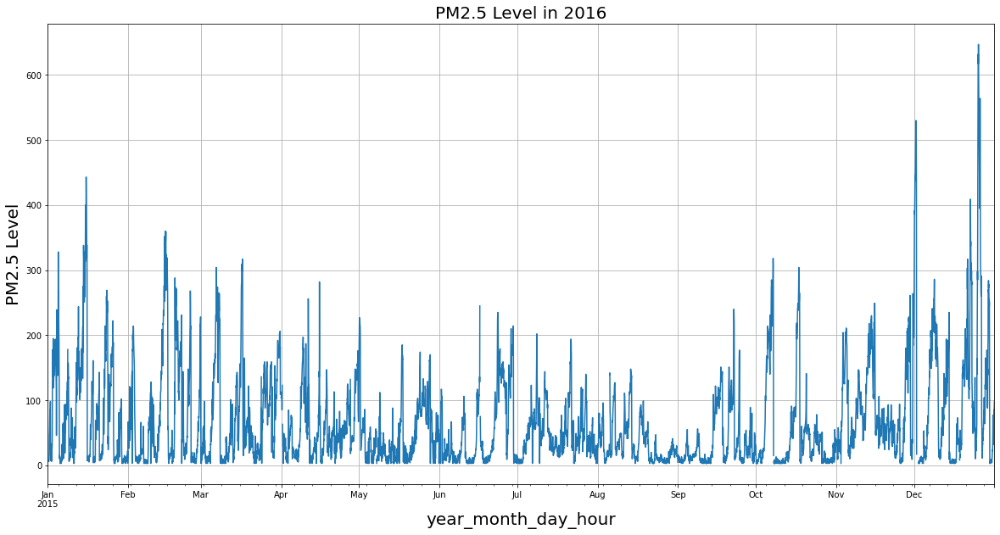

In [61]:
# For year 2016
df_new_2016 = df_new.loc['2016']
pm_data_2016 = df_new_2015['PM2.5']
plt.xlabel("Year : 2016",fontsize=20)
plt.ylabel("PM2.5 Level",fontsize=20)
plt.title("PM2.5 Level in 2016",fontsize=20)
pm_data_2016.plot(grid= True)
plt.rcParams['figure.figsize'] = [20, 10] 
plt.show()

In [26]:
# Plotly plot
fig = px.line(df_new_non_index, x='year_month_day_hour', y='PM2.5', title='PM2.5 with Slider')
fig.update_xaxes(rangeslider_visible=True)
fig.show()

In [27]:
# Plot several years
fig = px.line(df_new_non_index, x='year_month_day_hour', y='PM2.5', title='PM2.5 with Slider')
fig.update_xaxes(rangeslider_visible=True,rangeselector=dict(buttons=list
            ([dict(count=1, label="1y", step="year", stepmode="backward"),
              dict(count=2, label="2y", step="year", stepmode="backward"),
              dict(count=3, label="3y", step="year", stepmode="backward"),
              dict(step="all")])))
fig.show()

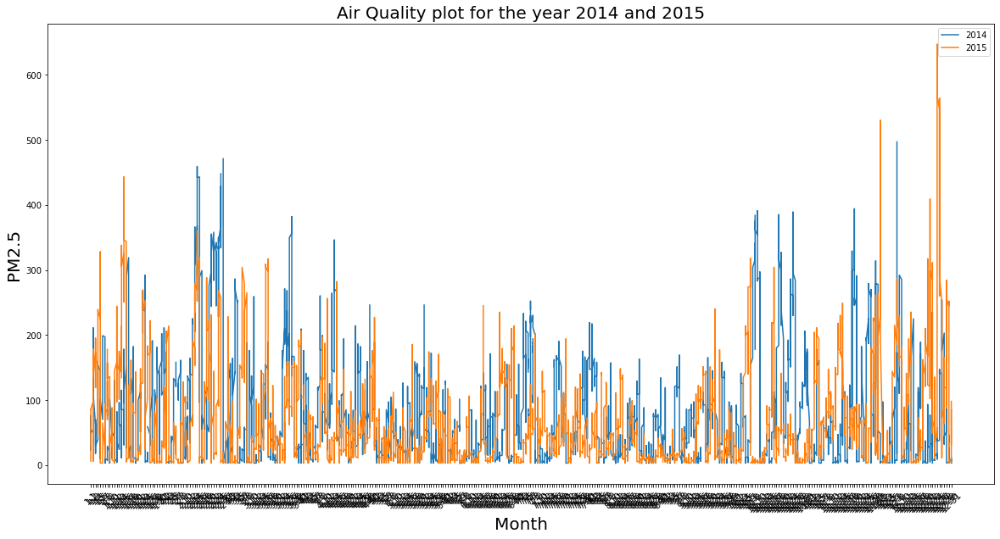

In [63]:
df_new_2014= df_new['2014'].reset_index()
df_new_2015 = df_new['2015'].reset_index()
df_new_2014['month_day_hour']=df_new_2014.apply(lambda x : str(x['month'])+"-"+x['day'],axis=1)
df_new_2015['month_day_hour']=df_new_2015.apply(lambda x : str(x['month'])+"-"+x['day'],axis=1)
plt.plot(df_new_2014['month_day_hour'], df_new_2014['PM2.5'])
plt.plot(df_new_2015['month_day_hour'], df_new_2015['PM2.5'])
plt.legend(['2014', '2015'])
plt.xlabel('Month',fontsize=20)
plt.ylabel('PM2.5',fontsize=20)
plt.rcParams['figure.figsize'] = [20, 10]
plt.title('Air Quality plot for the year 2014 and 2015',fontsize=20)
plt.xticks(rotation = 45)
plt.show()

### Grouping Data

In [29]:
df_new['2013':'2017'][['month','PM2.5']].groupby('month').describe()

PM2.5                                                      
        count       mean        std  min   25%   50%     75%    max
month                                                              
1      2914.0  73.156108  80.354854  3.0  12.0  38.0  117.00  536.0
2      2644.0  78.147126  98.050466  3.0  10.0  30.0  117.00  881.0
3      2956.0  84.098038  88.475610  3.0  13.0  52.0  130.25  474.0
4      2812.0  64.755974  56.796499  3.0  19.0  51.0   91.00  346.0
5      2894.0  53.704803  49.005236  3.0  17.0  41.0   75.00  358.0
6      2835.0  56.471182  53.692955  3.0  16.0  38.0   84.00  368.0
7      2915.0  59.806038  50.397464  3.0  20.0  45.0   89.00  252.0
8      2950.0  43.490136  39.320892  3.0  14.0  30.0   64.75  290.0
9      2790.0  49.931039  49.810494  3.0  12.0  31.0   80.00  285.0
10     2785.0  80.305925  88.636177  3.0  14.0  42.0  120.00  414.0
11     2861.0  69.901713  69.473950  3.0  15.0  49.0  102.00  394.0
12     2929.0  78.821441  96.614576  3.0  11.0  42.0  116.00  647.0

In [30]:
df_new['2013':'2017'][['month','PM2.5','TEMP']].groupby('month').agg({'PM2.5':['max'],'TEMP':['min','max']})

PM2.5  TEMP      
         max   min   max
month                   
1      536.0 -16.6  12.4
2      881.0 -10.9  15.6
3      474.0  -6.4  26.0
4      346.0   1.0  32.0
5      358.0   7.0  41.4
6      368.0  15.1  38.1
7      252.0  16.8  39.2
8      290.0  16.6  37.7
9      285.0   7.8  34.5
10     414.0  -1.4  28.1
11     394.0 -10.3  20.8
12     647.0  -9.7  14.2

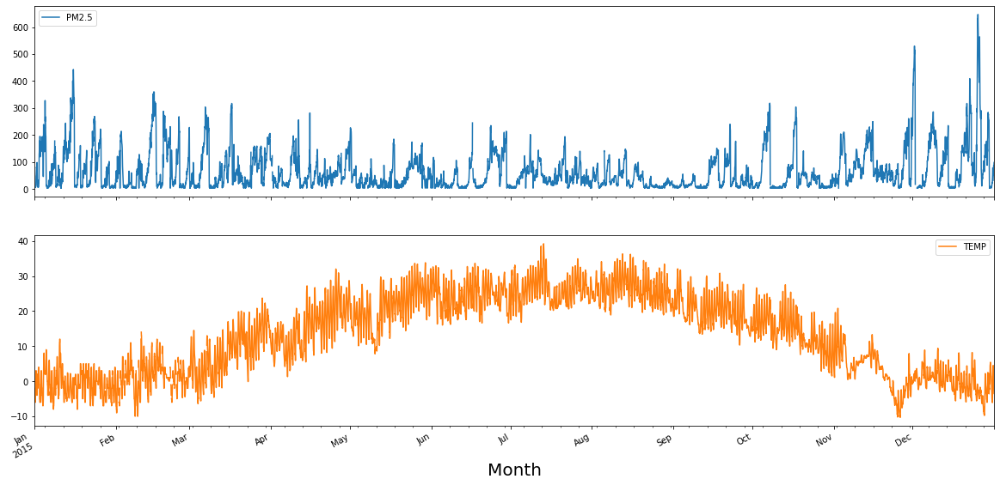

In [64]:
df_new_2015=df_new['2015']
pm_data_2015=df_new_2015[['PM2.5','TEMP']]
pm_data_2015.plot(subplots=True)
plt.xlabel('Month',fontsize=20)
plt.show()


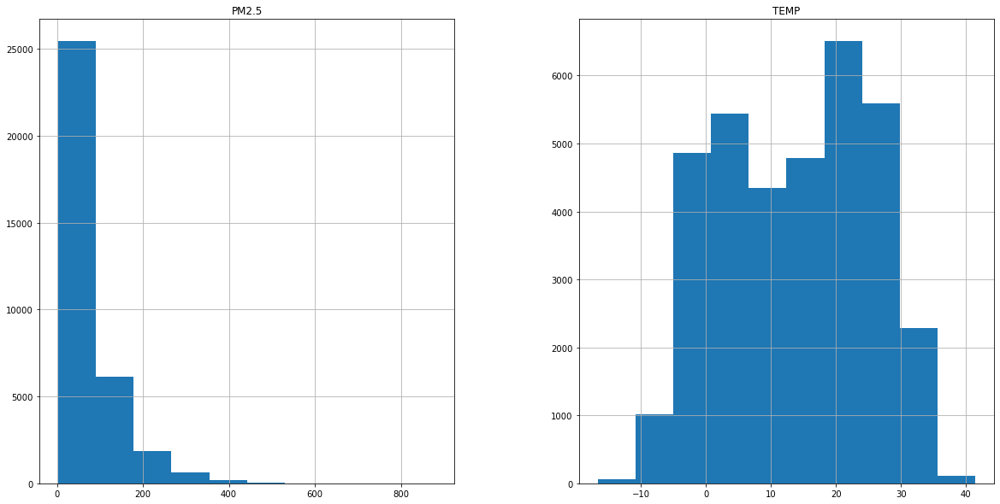

In [32]:
df_new[['PM2.5','TEMP']].hist()
plt.show()

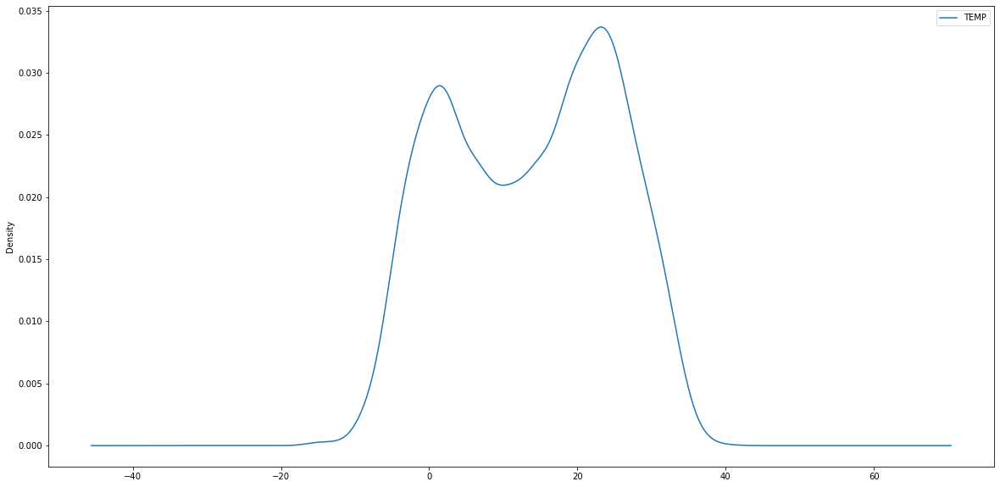

In [33]:
df_new[['TEMP']].plot(kind='density')
plt.show()

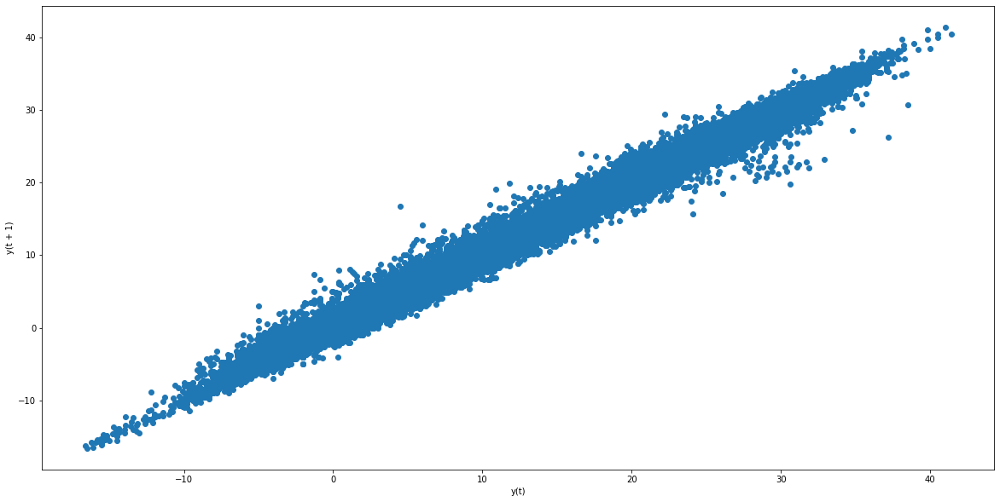

In [34]:
pd.plotting.lag_plot(df_new['TEMP'],lag=1)
plt.show()

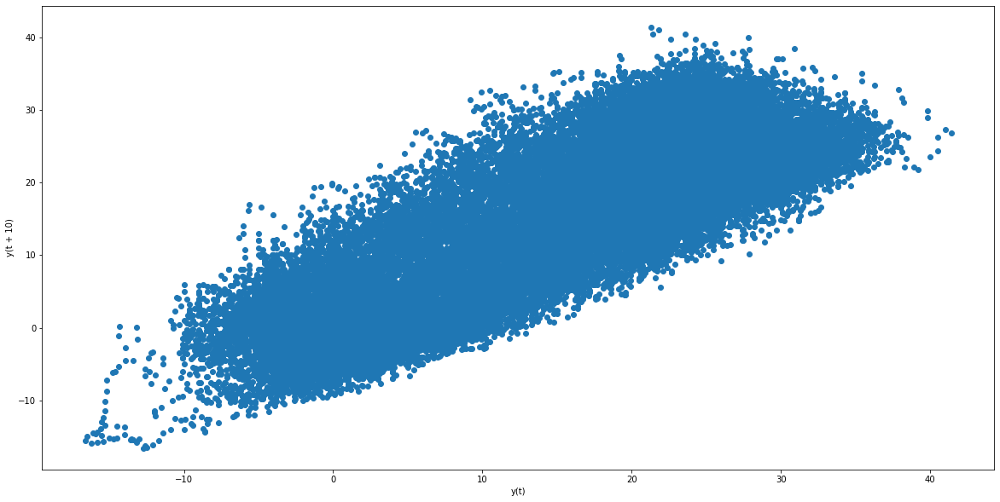

In [35]:
pd.plotting.lag_plot(df_new['TEMP'],lag=10)
plt.show()

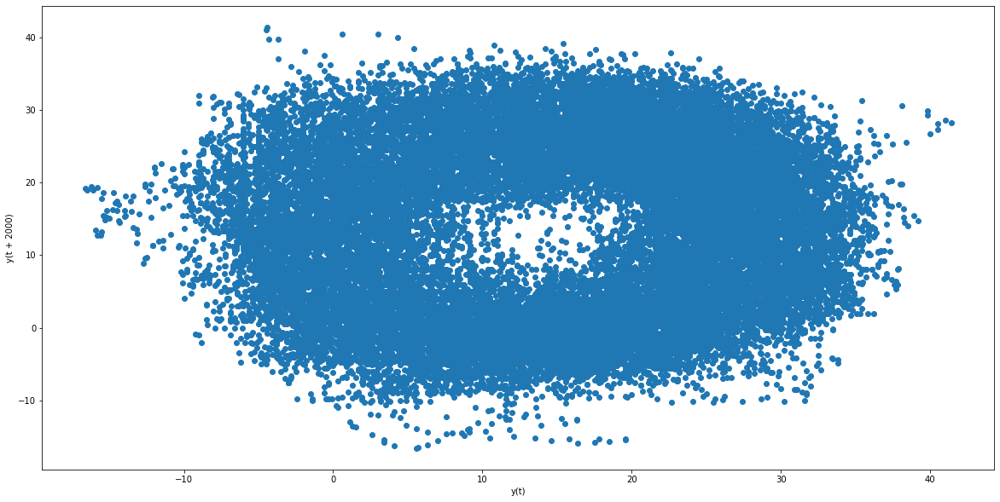

In [36]:
pd.plotting.lag_plot(df_new['TEMP'],lag=2000)
plt.show()

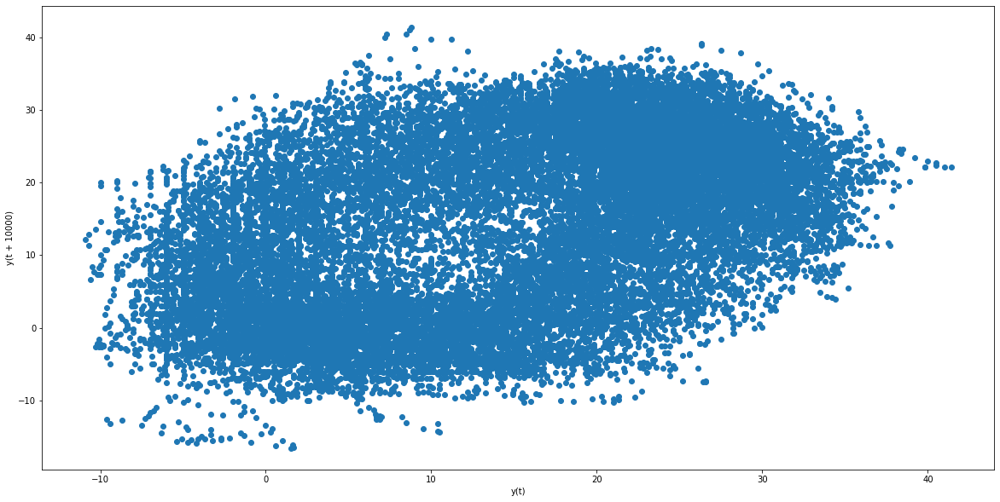

In [37]:
pd.plotting.lag_plot(df_new['TEMP'],lag=10000)
plt.show()

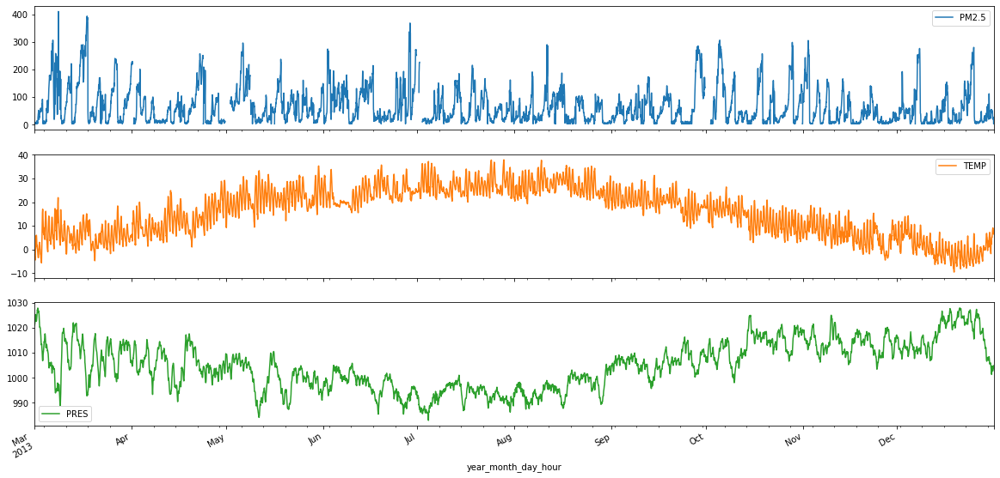

In [38]:
df_new_2013=df_new['2013']
pm_data_2013=df_new_2013[['PM2.5','TEMP','PRES']]
pm_data_2013.plot(subplots=True)
plt.show()

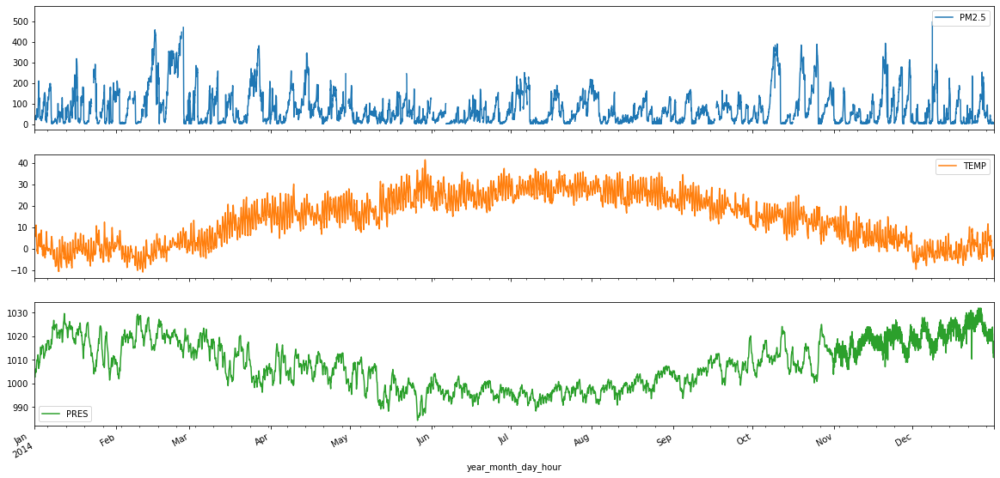

In [39]:
df_new_2014=df_new['2014']
pm_data_2014=df_new_2014[['PM2.5','TEMP','PRES']]
pm_data_2014.plot(subplots=True)
plt.show()

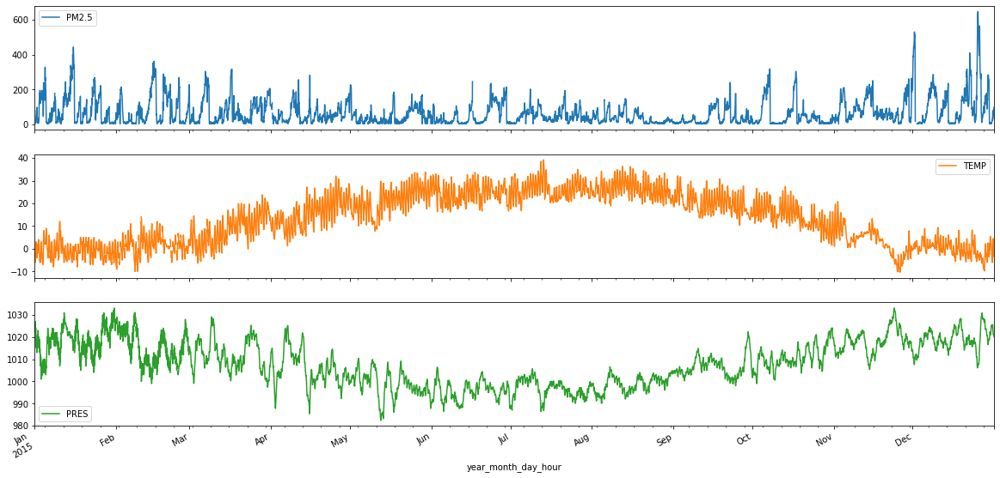

In [40]:
df_new_2015=df_new['2015']
pm_data_2015=df_new_2015[['PM2.5','TEMP','PRES']]
pm_data_2015.plot(subplots=True)
plt.show()

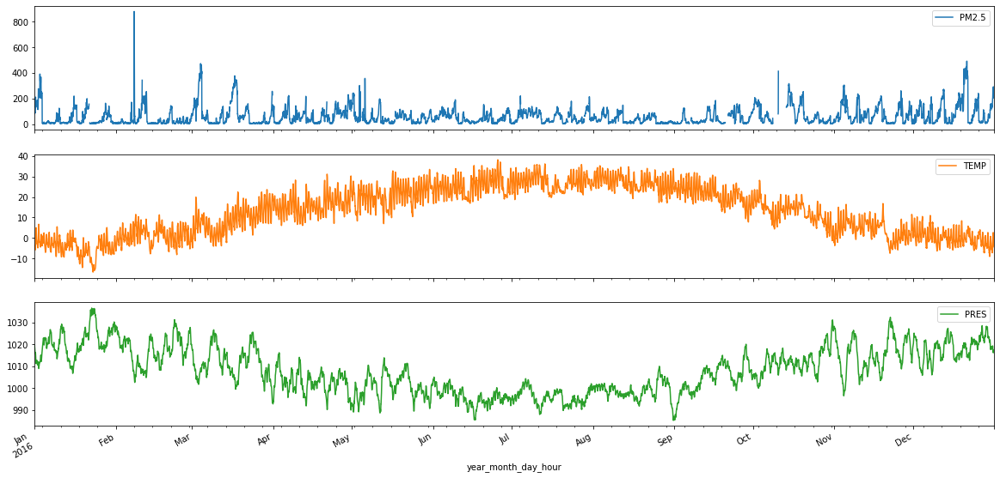

In [41]:
df_new_2016=df_new['2016']
pm_data_2016=df_new_2016[['PM2.5','TEMP','PRES']]
pm_data_2016.plot(subplots=True)
plt.show()

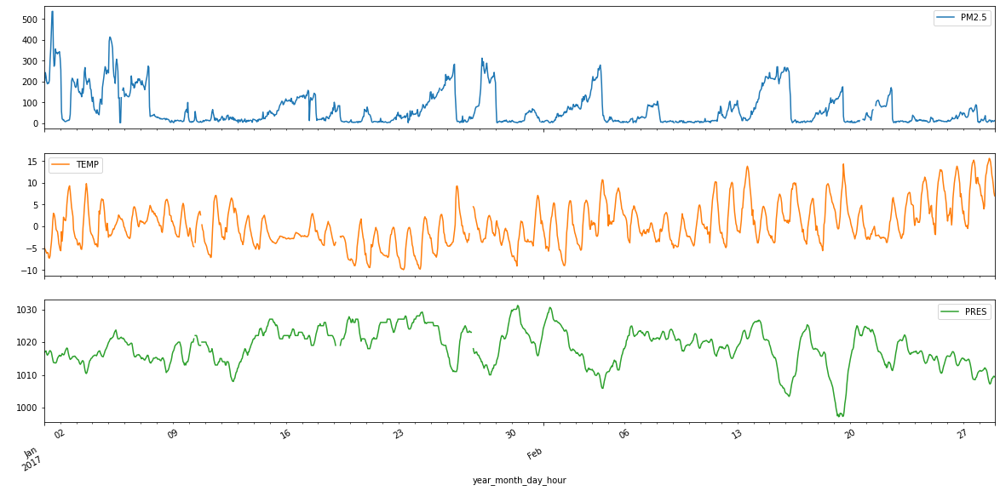

In [42]:
df_new_2017=df_new['2017']
pm_data_2017=df_new_2017[['PM2.5','TEMP','PRES']]
pm_data_2017.plot(subplots=True)
plt.show()

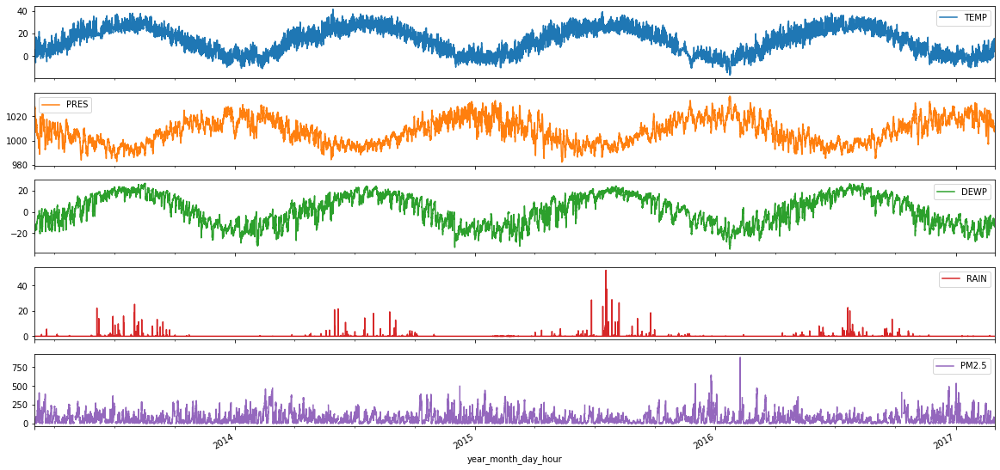

In [43]:
multi_data = df_new[['TEMP','PRES','DEWP', 'RAIN','PM2.5']]
multi_data.plot(subplots=True)
plt.show()

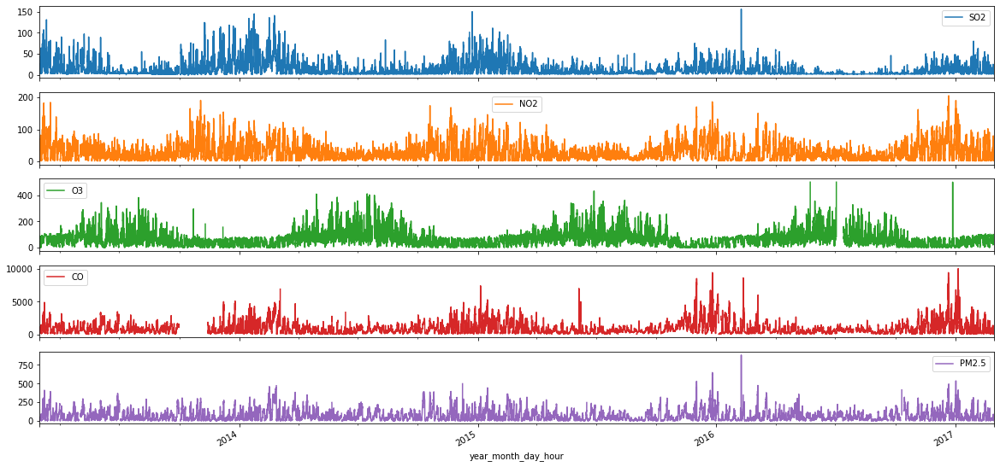

In [44]:
multi_data = df_new[['SO2','NO2','O3', 'CO','PM2.5']]
multi_data.plot(subplots=True)
plt.show()

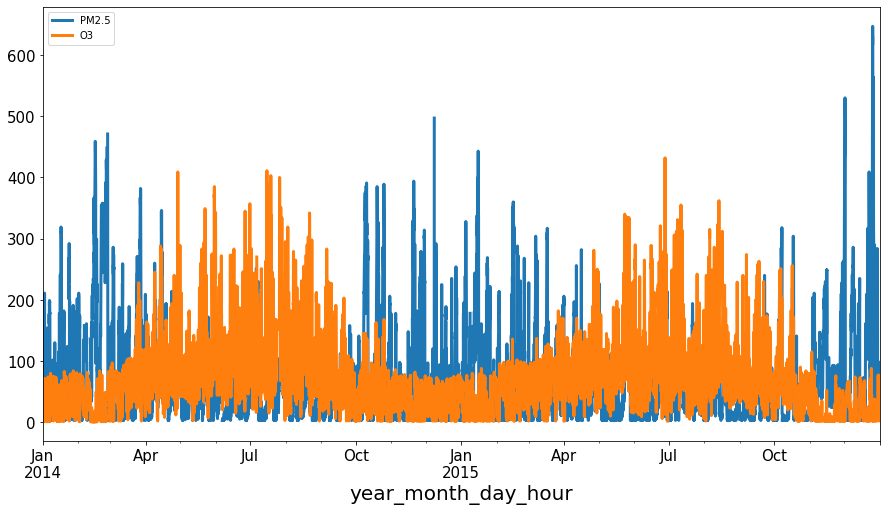

In [45]:
df_new['2014':'2015'][['PM2.5','O3']].plot(figsize=(15,8), linewidth=3, fontsize=15)
plt.xlabel('year_month_day_hour', fontsize=20)
plt.show()

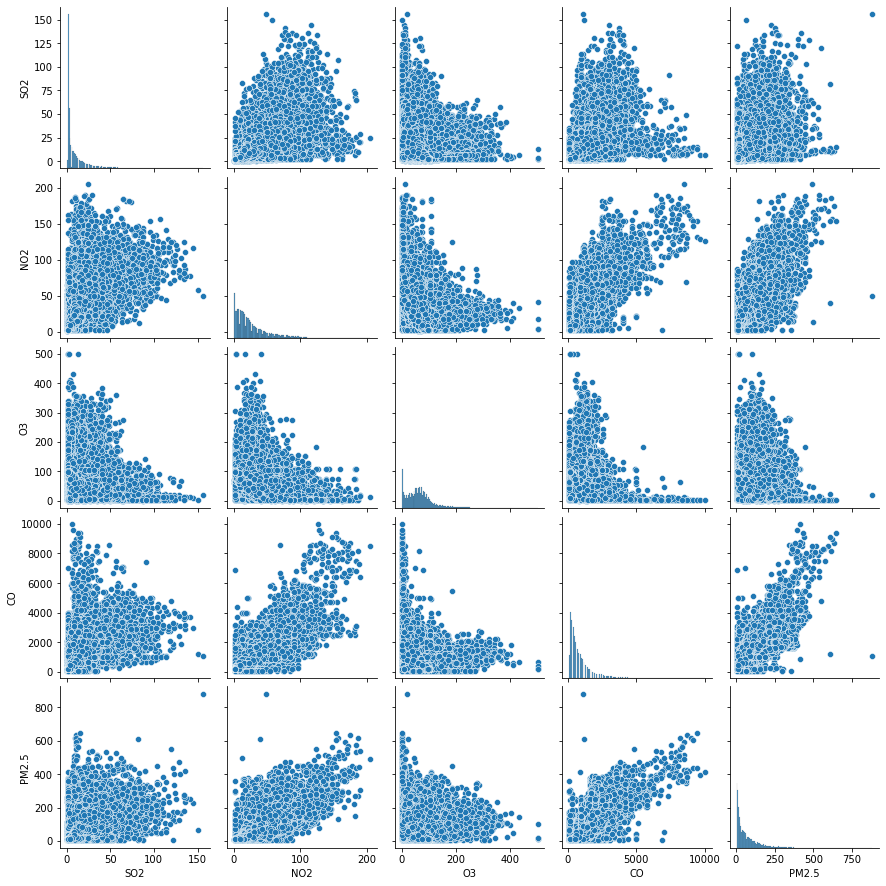

In [46]:
g=sns.pairplot(df_new[['SO2','NO2','O3','CO','PM2.5']])

In [47]:
aq_corr=df_new[['SO2','NO2','O3', 'CO','PM2.5']].corr(method='pearson')
aq_corr

,SO2,NO2,O3,CO,PM2.5
SO2,1.000000,0.610433,-0.182096,0.529182,0.475117
NO2,0.610433,1.000000,-0.373625,0.798753,0.718170
O3,-0.182096,-0.373625,1.000000,-0.303275,-0.100542
CO,0.529182,0.798753,-0.303275,1.000000,0.802737
PM2.5,0.475117,0.718170,-0.100542,0.802737,1.000000


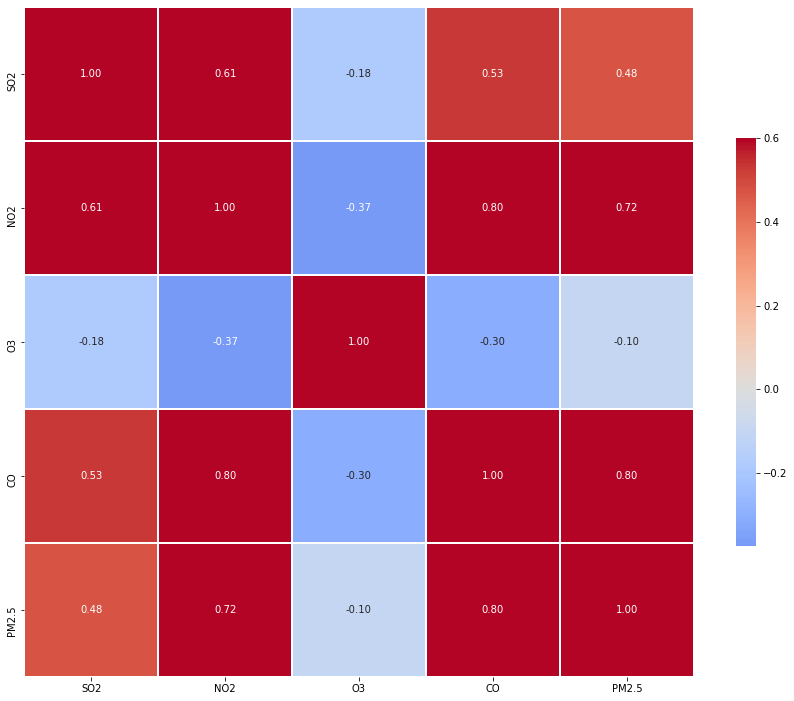

In [48]:
g = sns.heatmap(aq_corr, vmax=.6, center=0,square=True, 
                linewidths=.5, cbar_kws={"shrink": .5}, 
                annot=True, fmt='.2f', cmap='coolwarm')
g.figure.set_size_inches(15,15)
plt.show()

In [49]:
df_new.groupby('wd').agg(median=('PM2.5','median'),mean=('PM2.5','mean'),
                      max=('PM2.5','max'), min=('PM2.5','min')).reset_index()

,wd,median,mean,max,min
0,E,70.0,88.623363,434.0,3.0
1,ENE,56.5,77.685514,647.0,3.0
2,ESE,78.5,96.492276,632.0,3.0
3,N,29.0,57.546221,536.0,3.0
4,NE,32.0,57.390083,530.0,3.0
5,NNE,26.0,53.946239,881.0,3.0
6,NNW,33.0,62.790775,548.0,3.0
7,NW,21.0,52.769116,535.0,3.0
8,S,52.0,72.497281,511.0,3.0
9,SE,70.0,85.045709,617.0,3.0


In [50]:
df_new_na=df_new.copy()

In [51]:
df_new_na=df_new_na.dropna()

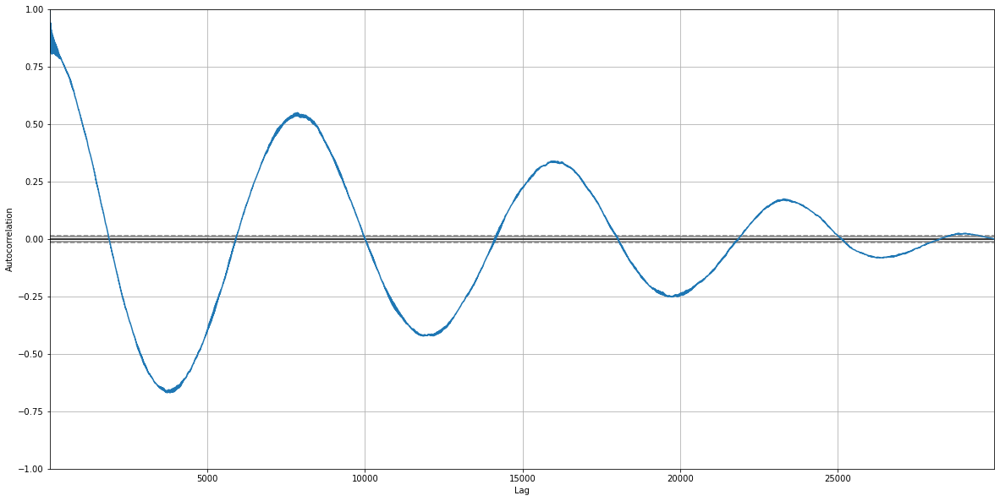

In [52]:
pd.plotting.autocorrelation_plot(df_new_na['2013':'2016']['TEMP'])
plt.show()

In [53]:
df_new_na['TEMP'].resample('1m').mean()

year_month_day_hour
2013-03-31     6.039970
2013-04-30    12.208494
2013-05-31    21.886386
2013-06-30    23.752827
2013-07-31    27.405079
2013-08-31    27.228465
2013-09-30    20.482500
2013-10-31          NaN
2013-11-30     5.434524
2013-12-31     0.896623
2014-01-31     0.023428
2014-02-28    -0.352762
2014-03-31    10.415449
2014-04-30    17.235362
2014-05-31    22.043236
2014-06-30    25.194985
2014-07-31    28.409502
2014-08-31    26.284552
2014-09-30    20.834161
2014-10-31    13.556000
2014-11-30     6.357762
2014-12-31    -0.745582
2015-01-31    -0.590377
2015-02-28     1.572512
2015-03-31     8.707613
2015-04-30    15.566570
2015-05-31    21.300275
2015-06-30    24.636691
2015-07-31    26.228630
2015-08-31    26.135854
2015-09-30    20.392206
2015-10-31    14.387465
2015-11-30     3.358686
2015-12-31    -0.053912
2016-01-31    -4.233428
2016-02-29     1.434441
2016-03-31     8.687006
2016-04-30    16.262014
2016-05-31    20.793142
2016-06-30    25.481977
2016-07-31    25.839

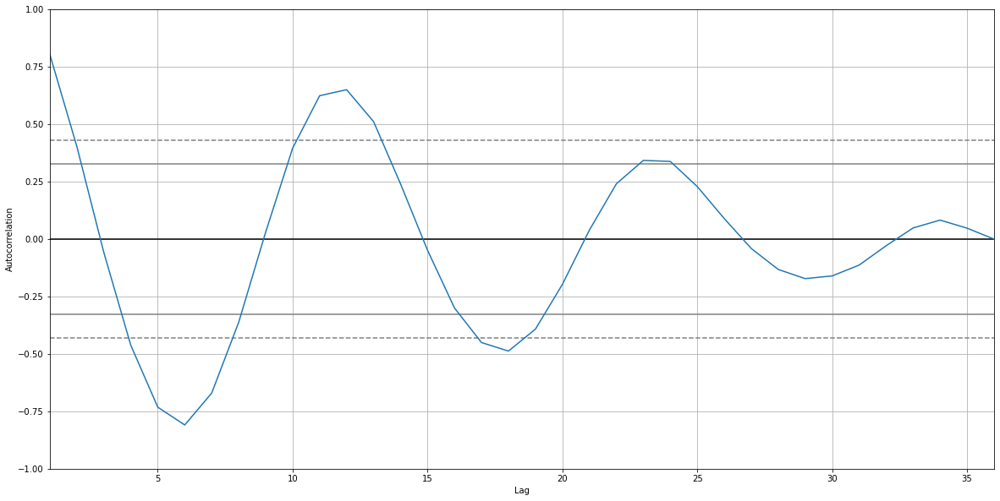

In [54]:
pd.plotting.autocorrelation_plot(df_new_na['2014':'2016']['TEMP'].resample("1m").mean())
plt.show()

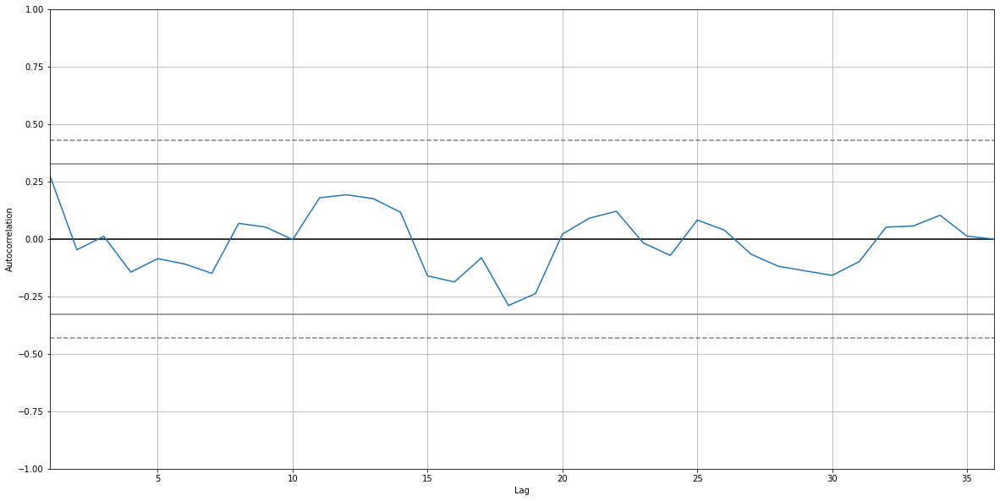

In [55]:
pd.plotting.autocorrelation_plot(df_new_na['2014':'2016']['PM2.5'].resample("1m").mean())
plt.show()

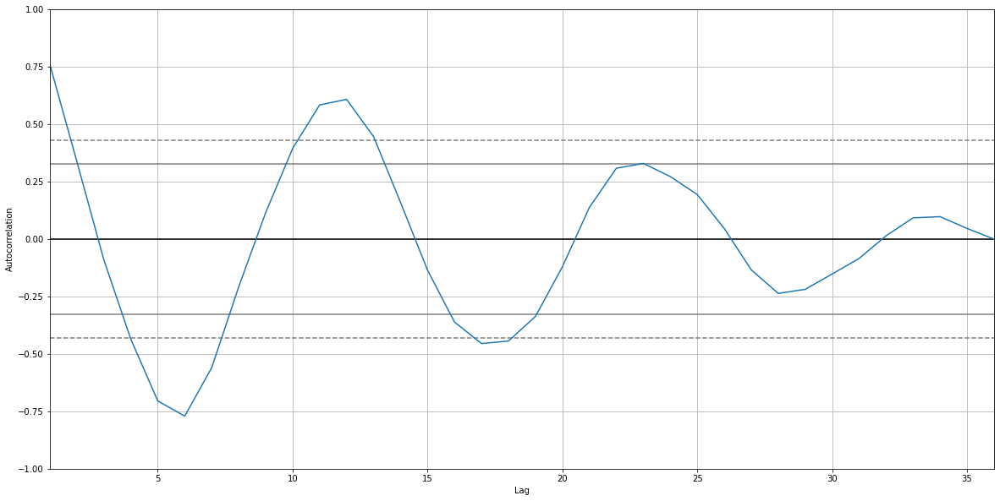

In [56]:
pd.plotting.autocorrelation_plot(df_new_na['2014':'2016']['O3'].resample("1m").mean())
plt.show()